# ELECTROENCEFALOGRAFÍA

## SET UP

Monto el drive:

[BASE DE DATOS A UTILIZAR](https://drive.google.com/drive/folders/1cLwXQrwSZbNowBZX2rRpeydKOpydvHQn?usp=sharing)

> Recordar que puede ser util añadir acceso directo a "Mi Unidad" de esta carpeta



Instalo e importo las librerías que voy a utilizar:

In [1]:
import numpy as np
import os
import scipy.signal
import matplotlib.pyplot as plt
import scipy.io
from scipy.fft import fft
import mne

## LECTURA DE ARCHIVO DE EEG


Para unir dos path se puede usar la librería `os` que permite hacer este tipo de "uniones" de rutas lo cual hace que sea más cómodo de ahora en más llamar a la carpeta madre y a los archivos internos que usemos:

In [9]:
ejemplo = os.path.join('C:', 'Aylin', 'Desktop', 'Docencia', '2024', 'PSIB', 'EEG', 'database')
ejemplo

'C:Aylin\\Desktop\\Docencia\\2024\\PSIB\\EEG\\database'

El "path" que utilizaremos de ahora en más es:

In [10]:
path = r'C:\Users\Juan Bautista\.vscode\PSIB\EEG\Clase EEG - Señales'

*(Siempre y cuando añadieran la base de datos a "Mi Unidad" como indique anteriormente)*

### .edf

In [11]:
raw0 = mne.io.read_raw_edf(os.path.join(path, 'chb01_03.edf'))

Extracting EDF parameters from C:\Users\Juan Bautista\.vscode\PSIB\EEG\Clase EEG - Señales\chb01_03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


C:\Users\Juan Bautista\AppData\Local\Temp\ipykernel_12528\4178699007.py:1: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  raw0 = mne.io.read_raw_edf(os.path.join(path, 'chb01_03.edf'))


In [12]:
raw0.ch_names # Ver qué canales tiene

['FP1-F7',
 'F7-T7',
 'T7-P7',
 'P7-O1',
 'FP1-F3',
 'F3-C3',
 'C3-P3',
 'P3-O1',
 'FP2-F4',
 'F4-C4',
 'C4-P4',
 'P4-O2',
 'FP2-F8',
 'F8-T8',
 'T8-P8-0',
 'P8-O2',
 'FZ-CZ',
 'CZ-PZ',
 'P7-T7',
 'T7-FT9',
 'FT9-FT10',
 'FT10-T8',
 'T8-P8-1']

In [13]:
data = raw0.get_data() # Obtener un numpy array con todos los canales
data

array([[-1.77777778e-05,  1.95360195e-07,  1.95360195e-07, ...,
        -1.77777778e-05, -8.79120879e-06, -4.88400488e-06],
       [ 3.92673993e-05,  1.95360195e-07,  1.95360195e-07, ...,
        -2.32478632e-05, -2.24664225e-05, -2.05128205e-05],
       [-3.71184371e-06,  1.95360195e-07,  1.95360195e-07, ...,
         5.91941392e-05,  6.03663004e-05,  5.91941392e-05],
       ...,
       [-9.18192918e-06,  1.95360195e-07,  1.95360195e-07, ...,
         4.86446886e-05,  2.79365079e-05,  1.26984127e-05],
       [-3.96581197e-05,  1.95360195e-07,  1.95360195e-07, ...,
         4.35653236e-05,  3.84859585e-05,  3.61416361e-05],
       [-5.99755800e-05,  1.95360195e-07,  1.95360195e-07, ...,
         1.93406593e-05,  2.63736264e-05,  3.22344322e-05]])

In [14]:
data.shape

(23, 921600)

In [15]:
fs = raw0.info['sfreq'] # Obtener la frecuencia de muestreo
fs

256.0

In [16]:
print(f'En el registro hay {data.shape[1]/fs} segundos ({data.shape[1]/fs/60} mins) de registro')
print(f'En el registro hay {len(raw0.ch_names)} canales registrados')

En el registro hay 3600.0 segundos (60.0 mins) de registro
En el registro hay 23 canales registrados


Si quisiera quedarme con un canal:

In [17]:
ch1 = data[0] #Es el canal FP1-F7
ch1_name = raw0.ch_names[0]
print(ch1)
print(ch1_name)

[-1.77777778e-05  1.95360195e-07  1.95360195e-07 ... -1.77777778e-05
 -8.79120879e-06 -4.88400488e-06]
FP1-F7


### .mat

Cargamos el archivo `eeg_epilepsia.mat`:

In [18]:
arch = scipy.io.loadmat(os.path.join(path,'eeg_epilepsia.mat'))

In [19]:
arch

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Sun May  3 15:18:03 2020',
 '__version__': '1.0',
 '__globals__': [],
 'data': array([[(array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                   6.44688645,   8.4004884 ],
                [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                  34.18803419,  43.56532357],
                [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                   6.83760684,   8.00976801],
                ...,
                [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
                 -18.16849817, -25.2014652 ],
                [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
                 -34.57875458, -32.23443223],
                [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                  42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..

In [20]:
type(arch)

dict

In [21]:
print(sorted(arch.keys()))

['__globals__', '__header__', '__version__', 'data']


Veo qué hay dentro de la key `data` del archivo cargado:


In [22]:
data = arch['data']
data

array([[(array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                  6.44688645,   8.4004884 ],
               [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                 34.18803419,  43.56532357],
               [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                  6.83760684,   8.00976801],
               ...,
               [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
                -18.16849817, -25.2014652 ],
               [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
                -34.57875458, -32.23443223],
               [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                 42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
                3155.99609375, 3156.        ]]))                                                                                              

In [23]:
type(data)

numpy.ndarray

In [24]:
data[0]

array([(array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                 6.44688645,   8.4004884 ],
              [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                34.18803419,  43.56532357],
              [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                 6.83760684,   8.00976801],
              ...,
              [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
               -18.16849817, -25.2014652 ],
              [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
               -34.57875458, -32.23443223],
              [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
               3155.99609375, 3156.        ]]))                                                                                                     ],
    

In [25]:
type(data[0])

numpy.ndarray

In [26]:
data[0][0]

np.void((array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
          6.44688645,   8.4004884 ],
       [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
         34.18803419,  43.56532357],
       [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
          6.83760684,   8.00976801],
       ...,
       [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
        -18.16849817, -25.2014652 ],
       [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
        -34.57875458, -32.23443223],
       [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
         42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
        3155.99609375, 3156.        ]])), dtype=[('x', 'O'), ('fs', 'O'), ('tiempo', 'O')])

In [27]:
type(data[0][0])

numpy.void



> ¿Qué es un numpy void?
[Link 1](https://numpy.org/doc/stable/reference/arrays.scalars.html#numpy.void)
[Link 2](https://numpy.org/doc/stable/reference/arrays.dtypes.html)



Para poder llamar a cada partecita de data, hay que manejarlo como si fuera un diccionario (aunque claramente no lo es, sino que es un numpy array como se vió anteriormente)

In [28]:
data

array([[(array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                  6.44688645,   8.4004884 ],
               [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                 34.18803419,  43.56532357],
               [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                  6.83760684,   8.00976801],
               ...,
               [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
                -18.16849817, -25.2014652 ],
               [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
                -34.57875458, -32.23443223],
               [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                 42.002442  ,  38.0952381 ]]), array([[256]], dtype=uint16), array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
                3155.99609375, 3156.        ]]))                                                                                              

In [29]:
x = data['x']
x

array([[array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                  6.44688645,   8.4004884 ],
               [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                 34.18803419,  43.56532357],
               [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                  6.83760684,   8.00976801],
               ...,
               [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
                -18.16849817, -25.2014652 ],
               [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
                -34.57875458, -32.23443223],
               [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                 42.002442  ,  38.0952381 ]])                               ]],
      dtype=object)

In [30]:
x[0][0].shape

(23, 71681)

In [31]:
fs = data['fs']
fs

array([[array([[256]], dtype=uint16)]], dtype=object)

In [32]:
tiempo = data['tiempo']
tiempo

array([[array([[2876.        , 2876.00390625, 2876.0078125 , ..., 3155.9921875 ,
                3155.99609375, 3156.        ]])                                 ]],
      dtype=object)

In [33]:
tiempo[0][0].shape

(1, 71681)

Veamos qué hay en `x` y el tamaño que tiene:

In [34]:
x.shape

(1, 1)

In [35]:
x

array([[array([[-18.94993895, -19.73137973, -18.16849817, ...,  -1.75824176,
                  6.44688645,   8.4004884 ],
               [-22.46642247, -16.996337  , -12.30769231, ...,  31.84371184,
                 34.18803419,  43.56532357],
               [-22.07570208, -20.9035409 , -18.55921856, ...,   9.57264957,
                  6.83760684,   8.00976801],
               ...,
               [ 31.84371184,  27.54578755,  23.63858364, ...,  -3.32112332,
                -18.16849817, -25.2014652 ],
               [-13.08913309, -11.91697192,  -9.18192918, ..., -21.29426129,
                -34.57875458, -32.23443223],
               [-50.5982906 , -45.51892552, -38.87667888, ...,  55.28693529,
                 42.002442  ,  38.0952381 ]])                               ]],
      dtype=object)

Se puede ver que los datos dentro de `data` están como en "capas" escondidos. Veamos qué hay dentro para sacarle esas capas a los datos:

In [36]:
x[0].shape # tamaño de la primer capa

(1,)

In [37]:
x[0][0].shape # tamaño de la segunda capa

(23, 71681)



<font color='yellow'>¿A qué hace referencia este tamaño?</font>

23 --> canales

71681 --> muestras tomadas

In [38]:
data['fs']

array([[array([[256]], dtype=uint16)]], dtype=object)

También está dentro de varias capas, por ende el valor se obtiene de la siguiente manera:

In [39]:
data['fs'][0][0][0][0]

np.uint16(256)

<font color='yellow'>¿Cuántos segundos de la señal hay registrados?</font>


In [40]:
print('Se registraron', x[0][0].shape[1]/data['fs'][0][0][0][0] , 'segundos')

Se registraron 280.00390625 segundos


Defino las variables :

*   `x`: matriz donde en cada fila están los canales cargados
*   `fs`: frecuencia de muestreo
*   `t`: vector tiempo
*   `cant_canales`: cantidad de canales dentro de x



In [41]:
x = x[0][0]
fs = fs[0][0][0][0]
t = tiempo[0][0]

In [42]:
cant_canales = x.shape[0]

In [43]:
x.shape[1]

71681

In [44]:
t.shape[0] == len(t)

True

In [45]:
t.shape[1]

71681

In [46]:
x.shape[1] == t.shape[1]

True

In [47]:
len(t[0])

71681

In [48]:
x.shape[1] == len(t[0])

True

Analizo qué onda las dimensiones de `x` y `tiempo`:

In [49]:
x[5].shape

(71681,)

In [50]:
t.shape

(1, 71681)

El vector tiempo está "dado vuelta", por ende lo transpongo para que coincida con la información en cada canal y al mismo tiempo le sacó la dimensión de más que tiene:

In [51]:
t = t.T

In [52]:
t.shape

(71681, 1)

In [53]:
t

array([[2876.        ],
       [2876.00390625],
       [2876.0078125 ],
       ...,
       [3155.9921875 ],
       [3155.99609375],
       [3156.        ]])

In [54]:
t = t.ravel() # le saca la dimensión de más que tiene

In [55]:
t.shape

(71681,)

In [56]:
x[9].shape

(71681,)



> [numpy.ravel](https://numpy.org/doc/stable/reference/generated/numpy.ravel.html)



Me va a ser de utilidad este arreglo para más adelante:

In [57]:
canales = np.arange(0,cant_canales)+1
canales

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23])

## VISUALIZACIÓN DE EEG

### Canales por separados

In [58]:
t[1]-t[0]

np.float64(0.00390625)

In [59]:
1/fs

np.float64(0.00390625)

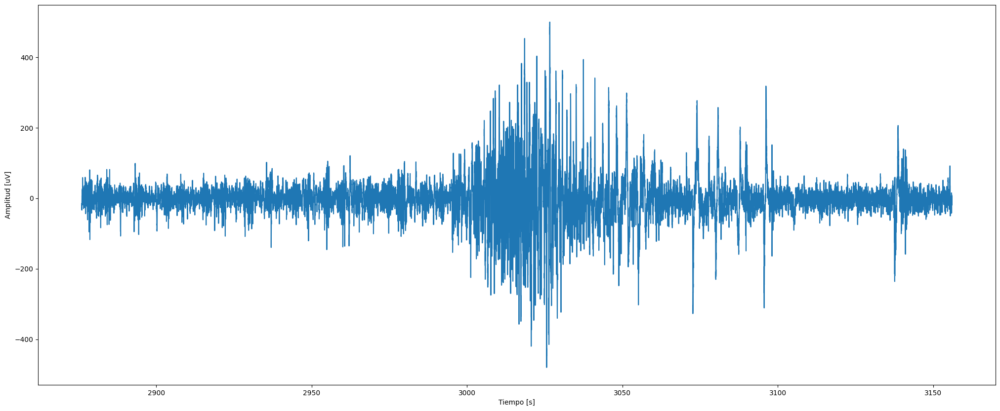

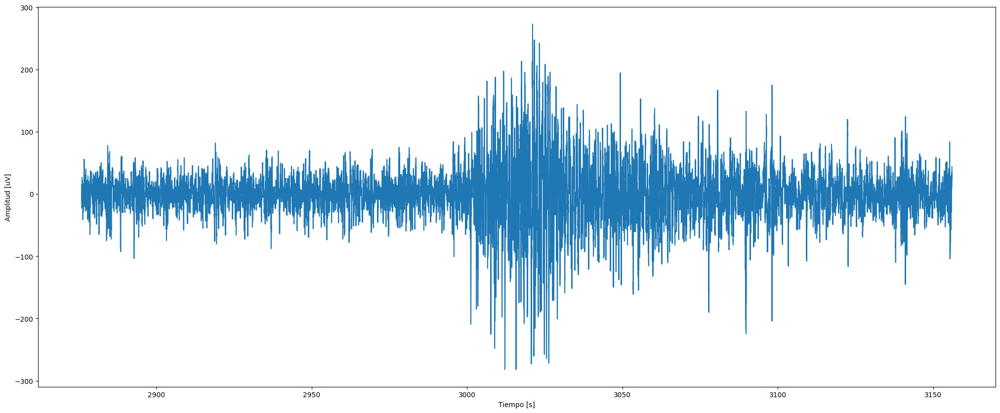

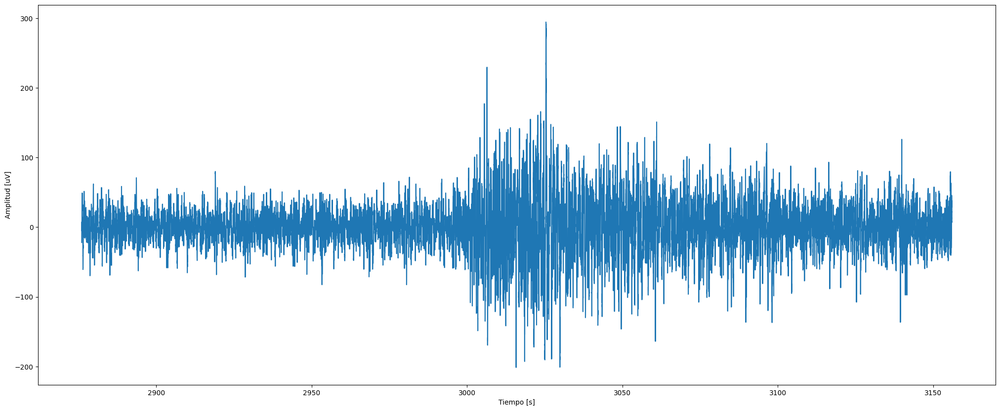

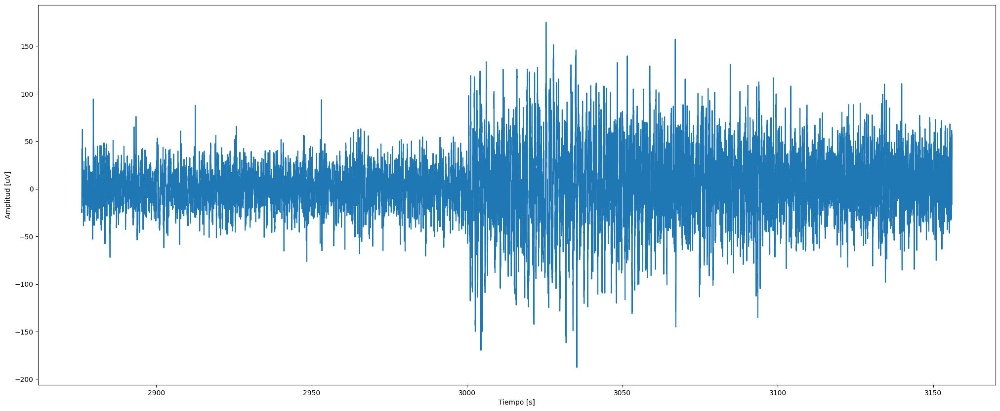

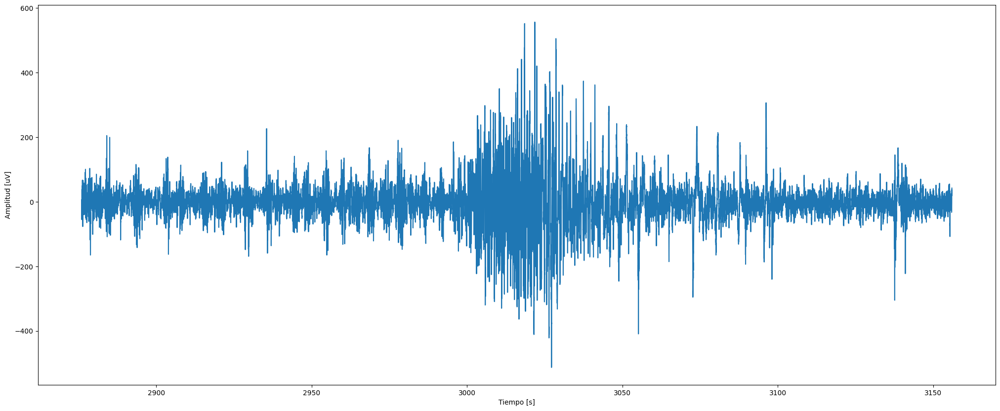

...

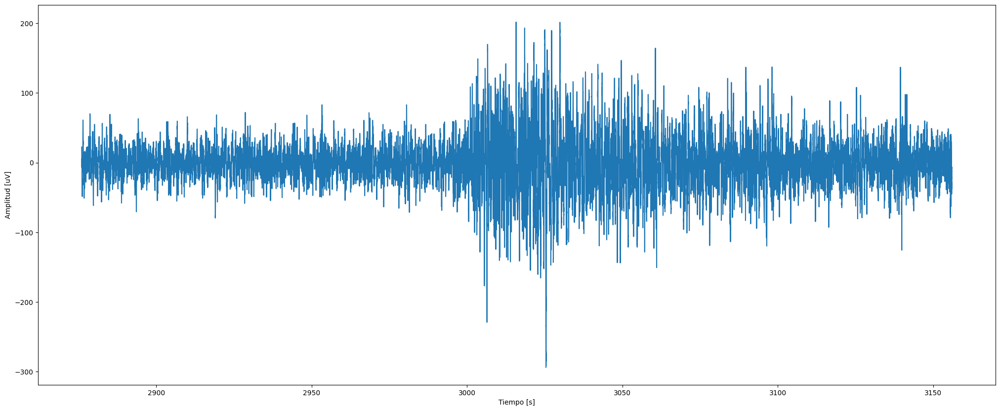

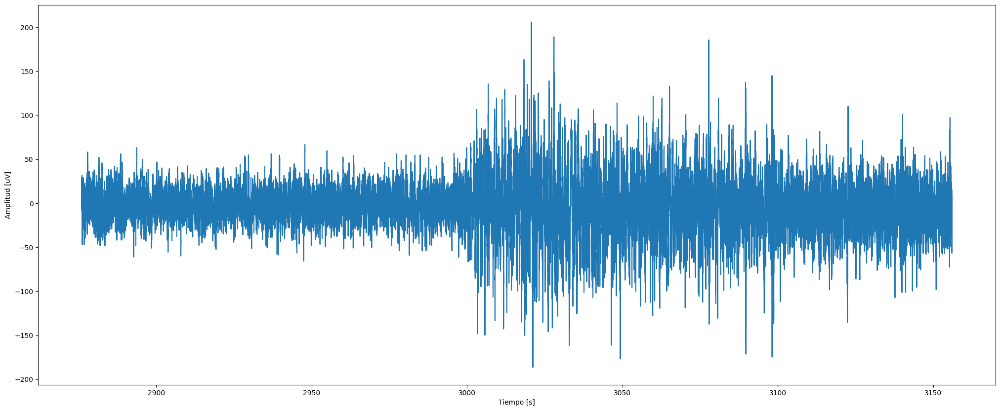

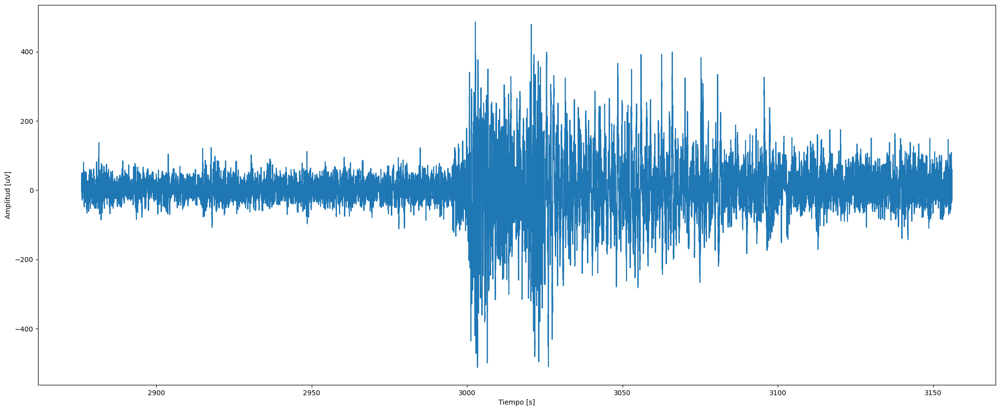

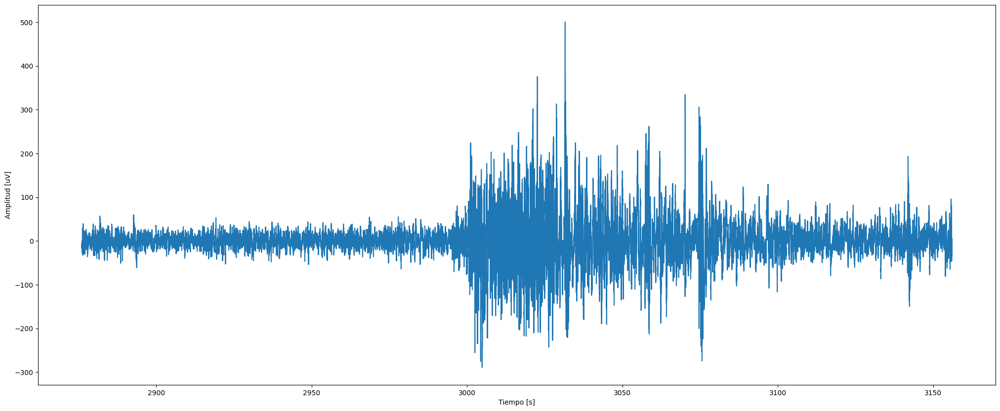

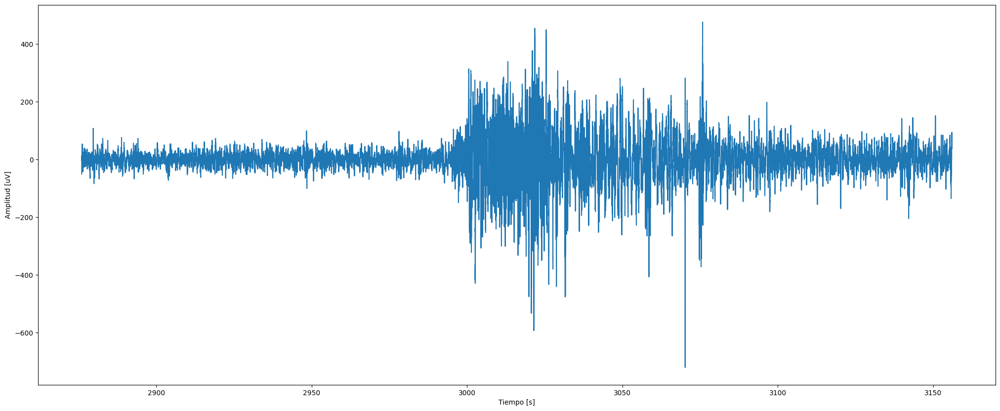

In [60]:
for c in canales:
  plt.figure(figsize=(25,10))
  titulo = 'Canal' + str(c+1)
  plt.plot(t, x[c-1])
  plt.ylabel('Amplitud [uV]')
  plt.xlabel('Tiempo [s]')
  plt.show()

### Gráfico mariposa

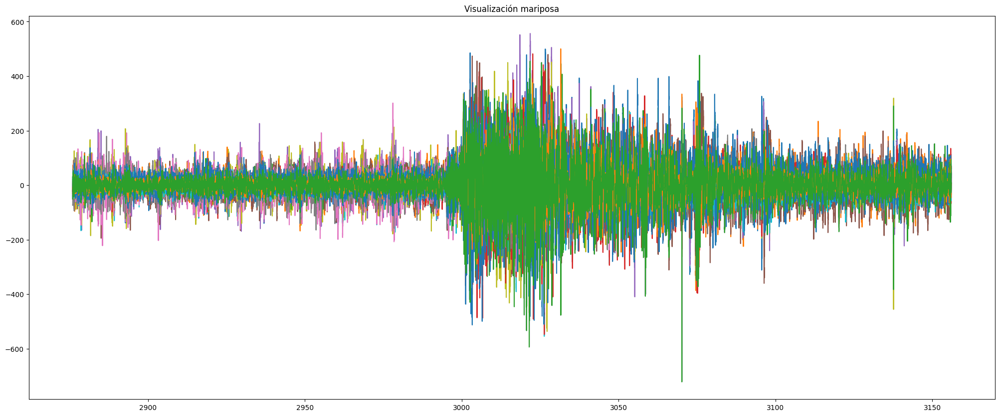

In [61]:
plt.figure(figsize=(25,10))
for c in canales:
  plt.plot(t, x[c-1])

plt.title('Visualización mariposa')
plt.show()

### Canales juntos

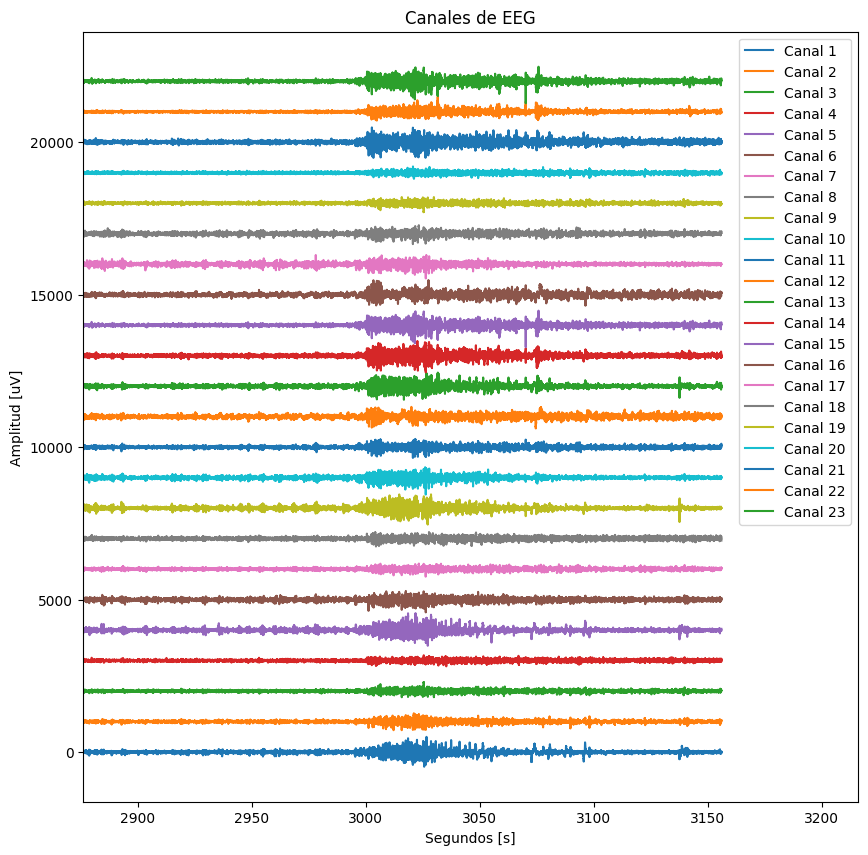

In [62]:
plt.figure(figsize=(10,10))
i = 0
titulo = 'Canales de EEG'

for c in canales:
  plt.plot(t,x[c-1]-i, label = f'Canal {c}')
  i = i - 1000

plt.xlabel('Segundos [s]')
plt.ylabel('Amplitud [uV]')
plt.xlim([t[0],t[-1]+60])
plt.title(titulo)
plt.legend(loc = 'upper right')
plt.show()

## MODELADO DE EEG

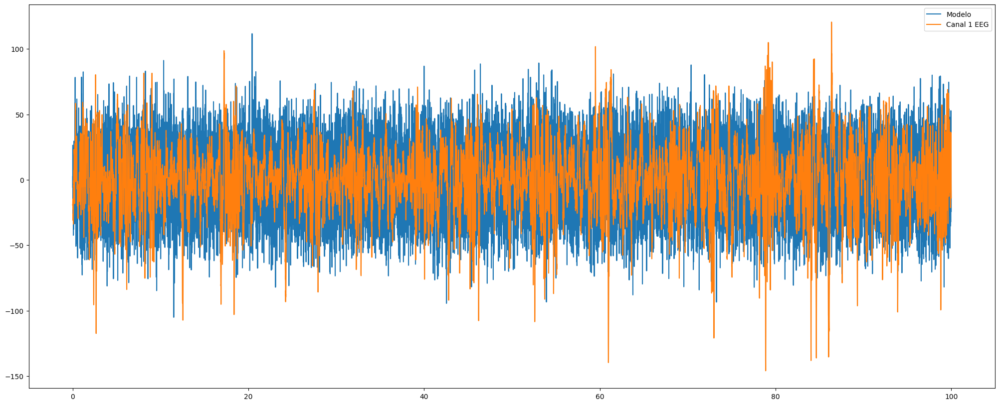

In [63]:
modelo = 25*np.random.normal(0,1,fs*100)
t_modelo = np.linspace(0, 100, fs*100)

plt.figure(figsize=(25,10))
plt.plot(t_modelo, modelo, label='Modelo')
plt.plot(t_modelo, x[0][:100*fs], label='Canal 1 EEG')
plt.legend()
plt.show()

In [64]:
print(np.mean(modelo))
print(np.mean(x[0][:100*fs]))

-0.1447332257508025
0.18759157509157437


In [65]:
print(np.std(modelo))
print(np.std(x[0][:100*fs]))

25.02236563653223
26.431559723396575


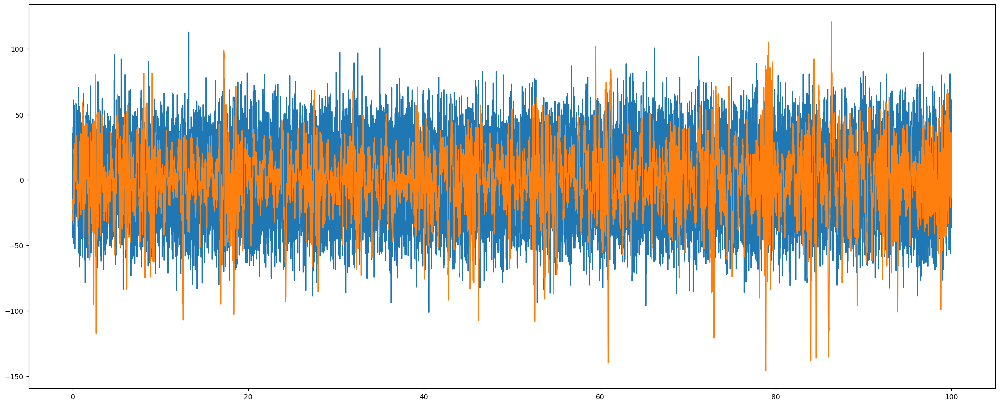

In [66]:
modelo = np.random.normal(0.18759157509157437,26.431559723396575,fs*100)
t_modelo = np.linspace(0, 100, fs*100)

plt.figure(figsize=(25,10))
plt.plot(t_modelo, modelo, label='Modelo')
plt.plot(t_modelo, x[0][:100*fs], label='Canal 1 EEG')
plt.show()

<font color = "yellow">¿A qué se debe esta diferencia?</font>

## RITMOS DEL EEG


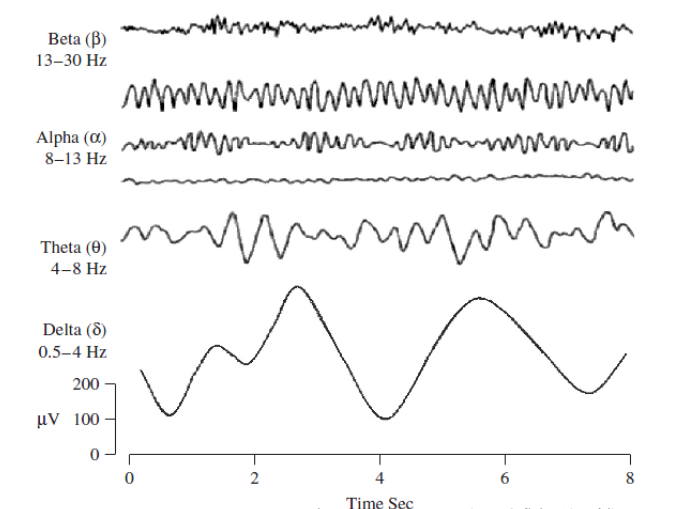

Definamos las bandas frecuenciales de cada ritmo en un diccionario para que sea más sencillo acceder a esta información:

In [67]:
ritmos_cerebrales ={
            'delta': [1, 4],
            'theta': [4, 8],
            'alpha': [8, 13],
            'sigma': [13,15],
            'beta': [15, 30],
            'gamma': [30, 100]}

In [68]:
ritmos_cerebrales['alpha']

[8, 13]

<font color = "yellow">¿Cómo podemos evaluar "qué tan presentes" está cada ritmo en una tira de EEG?</font>

## ESPECTRO DEL EEG

[Fast Fourier Transform](https://docs.scipy.org/doc/scipy/tutorial/fft.html)

[matplotlib.pyplot.psd()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.psd.html)

[scipy.signal.welch()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.welch.html)

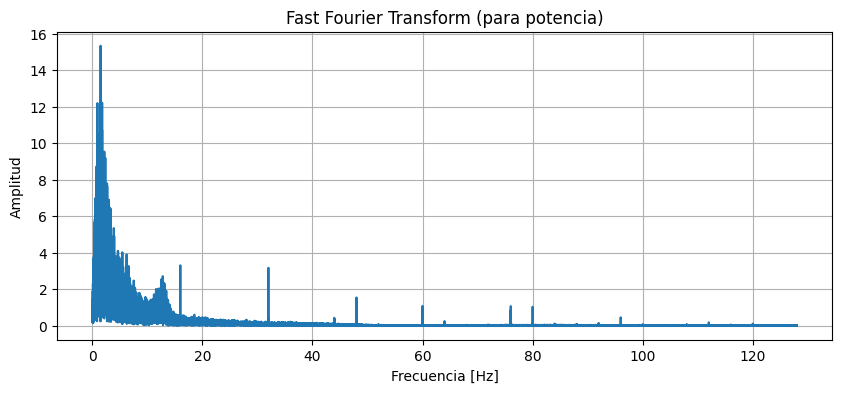

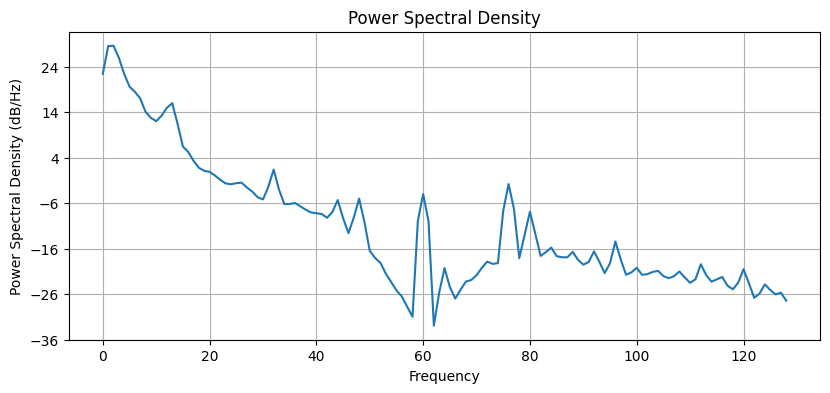

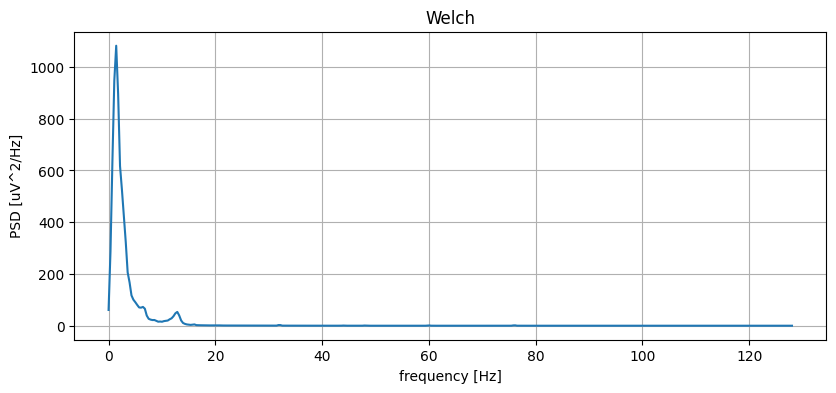

In [69]:
canal = 18

canal_fft = fft(x[canal-1])
canal_fft = canal_fft[:len(canal_fft)//2]
L = canal_fft.shape[0]

f = np.linspace(0,fs/2,L)
y = 2.0/L * np.abs(canal_fft)

plt.figure(figsize = (10,4))
plt.title('Fast Fourier Transform (para potencia)')
plt.plot(f,y)
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.grid()
plt.show()

plt.figure(figsize = (9.7,4))
plt.title('Power Spectral Density')
plt.psd(x[canal-1], Fs=fs, NFFT=2**8) #Cambiar NFFT
plt.show()

nper = int(len(x[canal-1])//100)
f, Pxx_den = scipy.signal.welch(x[canal-1], fs, noverlap=nper/2  , nperseg=nper)
plt.figure(figsize = (9.7,4))
plt.plot(f, Pxx_den)
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [uV^2/Hz]')
plt.title('Welch')
plt.grid()
plt.show()

## ESPECTROGRAMA DE UN EEG

<font color = "yellow">¿Qué podemos ver en el espectograma de una señal?</font>

[plt.specgram()](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.specgram.html#matplotlib.axes.Axes.specgram)

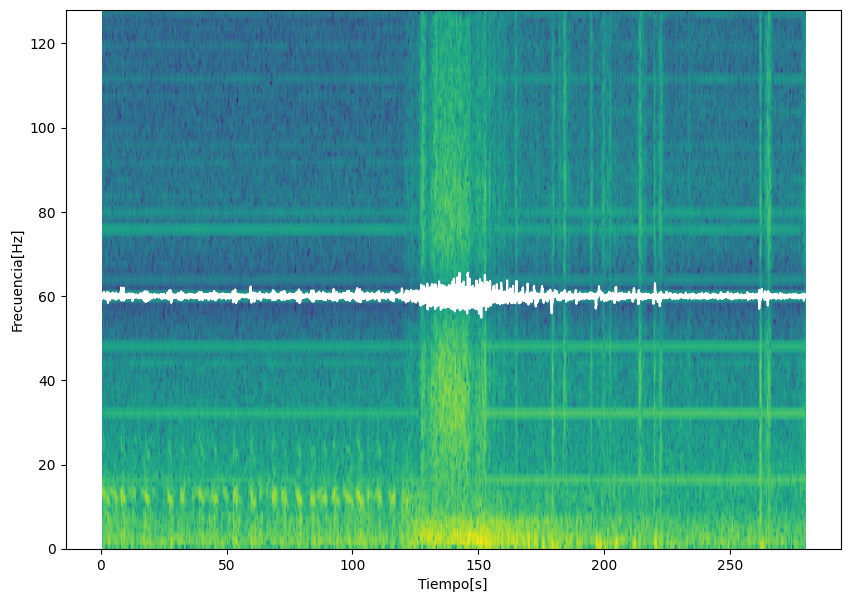

In [70]:
canal = 4
plt.figure(figsize = (10,7))
spectrum, fr, ti, im = plt.specgram(x[canal], Fs=fs)
plt.plot(np.linspace(0,len(x[canal])/fs, len(x[canal])), 60 + x[canal]*1e-2, 'white')
plt.xlabel('Tiempo[s]')
plt.ylabel('Frecuencia[Hz]')
plt.show()

In [71]:
spectrum.shape

(129, 559)

In [72]:
fr.shape

(129,)

In [73]:
ti.shape

(559,)

In [74]:
im

Tratemos de superponer el eeg en este espectrograma:

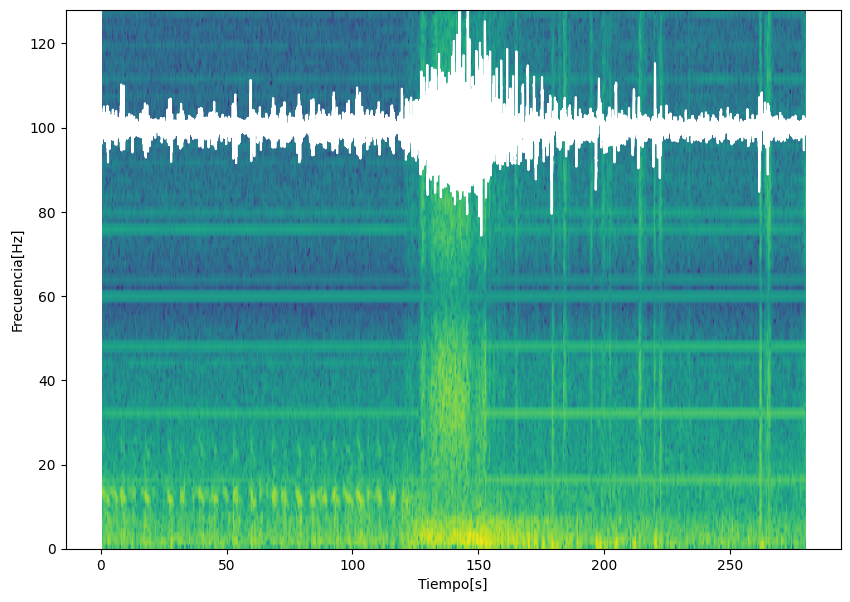

In [75]:
canal = 4

t_reset = np.linspace(0, x[canal].shape[0]/fs , x[canal].shape[0]) #¿Por qué necesito hacer esto?

plt.figure(figsize = (10,7))
_ = plt.specgram(x[canal], Fs=fs)
plt.plot(t_reset,x[canal]*0.05+100,'w')
plt.xlabel('Tiempo[s]')
plt.ylabel('Frecuencia[Hz]')
plt.show()

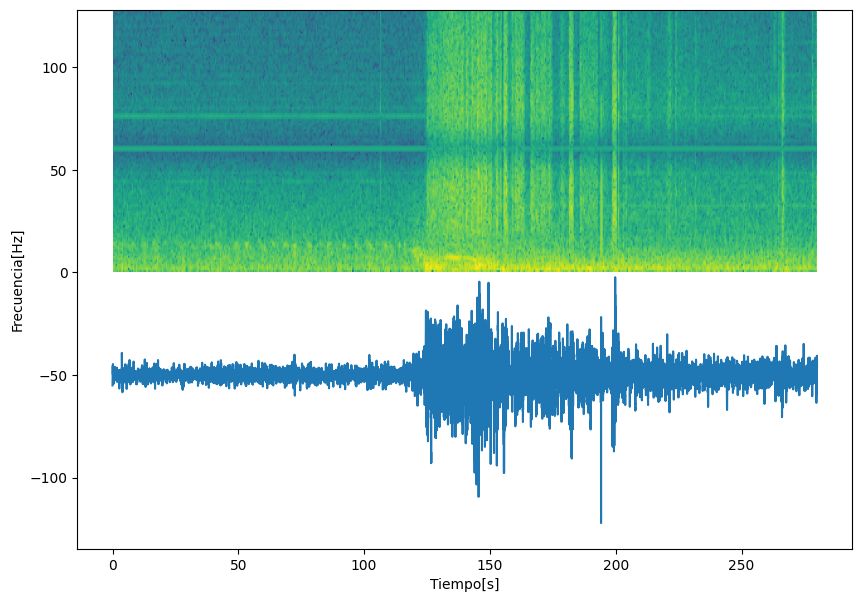

In [76]:
canal = 14
plt.figure(figsize = (10,7))
plt.specgram(x[canal], Fs=fs)
plt.plot(t_reset,x[canal]*0.1-50)
plt.xlabel('Tiempo[s]')
plt.ylabel('Frecuencia[Hz]')
plt.show()

### Ejemplo con espectrograma de Chirp

[Chirp](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.chirp.html)

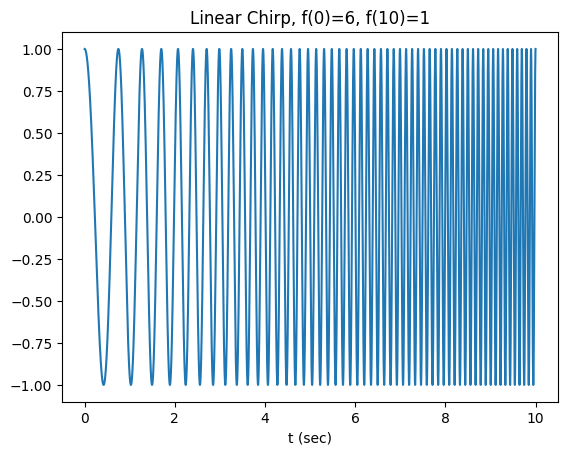

In [77]:
fs_chirp = 1000
t_end = 10
t_chirp = np.linspace(0, t_end, t_end*fs_chirp)
x_chirp = scipy.signal.chirp(t_chirp, f0=1, f1=10, t1=t_end, method='linear')
plt.plot(t_chirp, x_chirp)
plt.title("Linear Chirp, f(0)=6, f(10)=1")
plt.xlabel('t (sec)')
plt.show()

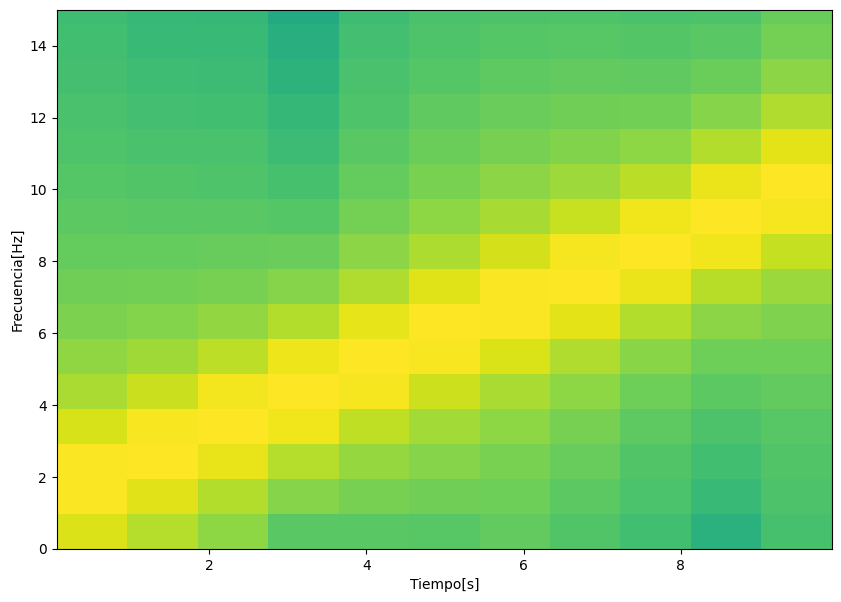

In [78]:
plt.figure(figsize = (10,7))
plt.specgram(x_chirp, Fs=fs_chirp, NFFT=2**10)
plt.xlabel('Tiempo[s]')
plt.ylabel('Frecuencia[Hz]')
plt.ylim([0,15])
plt.show()

## ELIMINACIÓN DE RUIDO EN EEG

Vamos a usar un filtro Butterworth mediante la función [scipy.signal.butter()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.butter.html)

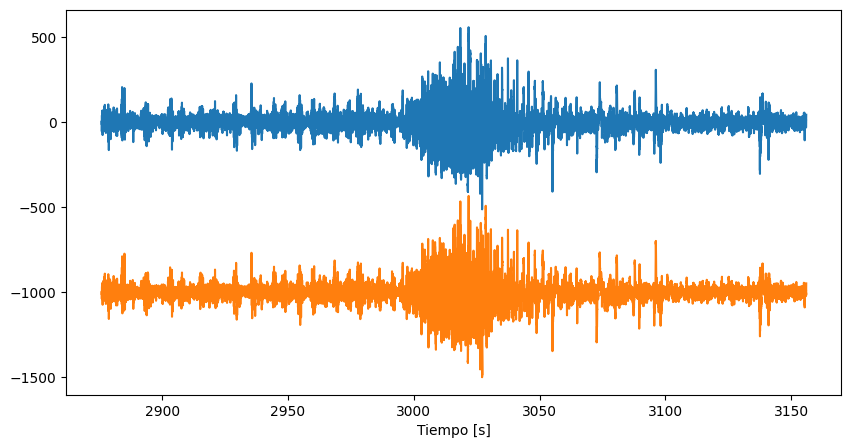

In [79]:
N = 5
wn = [15,17] #Queremos eliminar el pico de 16Hz
canal = 4

[b,a] = scipy.signal.butter(N, wn, btype = 'bandstop', fs = fs)

filtrada = scipy.signal.lfilter(b,a,x[canal])

plt.figure(figsize=(10,5))
plt.plot(t,x[canal])
plt.plot(t,filtrada - 1000)
plt.xlabel('Tiempo [s]')
plt.show()

Vemos en detalle:

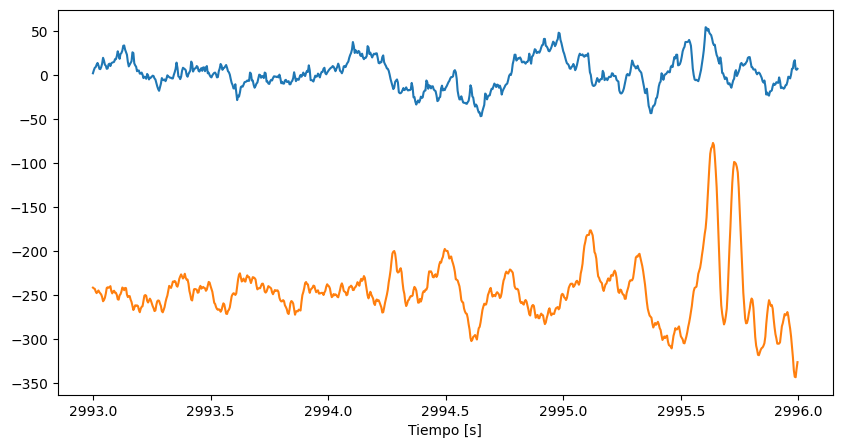

In [80]:
pos_inic = 117 * fs
pos_fin = 120 * fs

plt.figure(figsize=(10,5))
plt.plot(t[pos_inic:pos_fin],x[canal-1][pos_inic:pos_fin])
plt.plot(t[pos_inic:pos_fin],filtrada[pos_inic:pos_fin]-250)
plt.xlabel('Tiempo [s]')
plt.show()

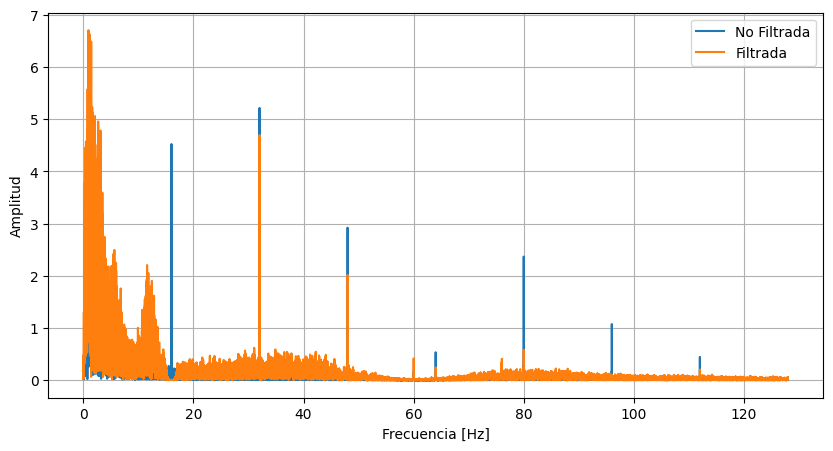

In [81]:
filtrada_fft = fft(filtrada)
canal_fft = fft(x[canal-1])

L = filtrada_fft.shape[0]

f = np.linspace(0,1,L) * fs
y = 2.0/L * np.abs(canal_fft[0:int(L/2)])

f_filt = np.linspace(0,1,L) * fs
y_filt = 2.0/L * np.abs(filtrada_fft[0:int(L/2)])

plt.figure(figsize = (10,5))
plt.plot(f[:int(L/2)],y, label = 'No Filtrada')
plt.plot(f_filt[:int(L/2)],y_filt, label = 'Filtrada')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.legend()
plt.grid()
plt.show()

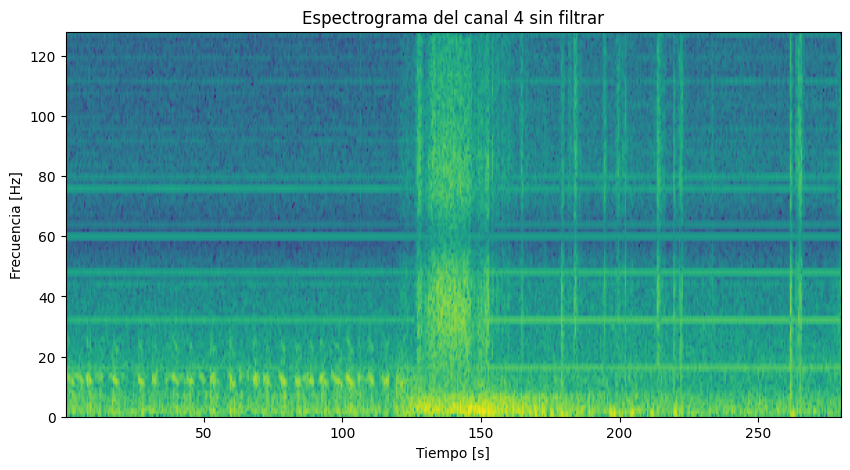

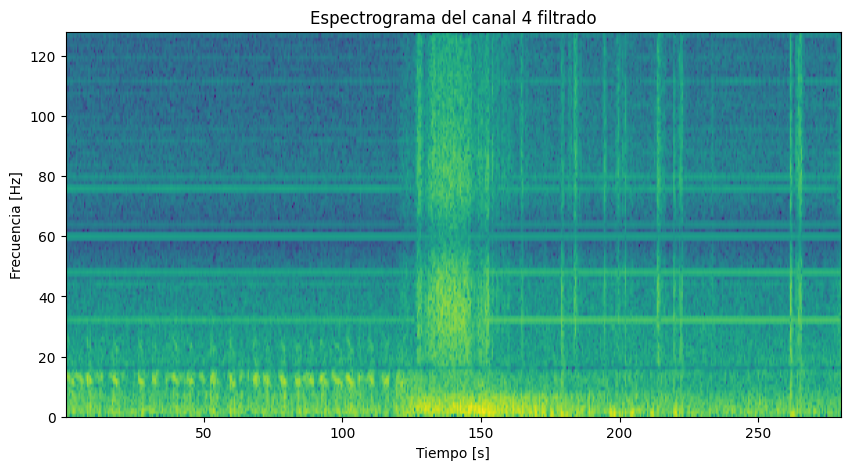

In [82]:
plt.figure(figsize=(10,5))
plt.specgram(x[canal], Fs = fs)
plt.title('Espectrograma del canal 4 sin filtrar')
plt.xlabel('Tiempo [s]')
plt.ylabel('Frecuencia [Hz]')
plt.show()

plt.figure(figsize=(10,5))
plt.specgram(filtrada, Fs = fs)
plt.title('Espectrograma del canal 4 filtrado')
plt.xlabel('Tiempo [s]')
plt.ylabel('Frecuencia [Hz]')
plt.show()

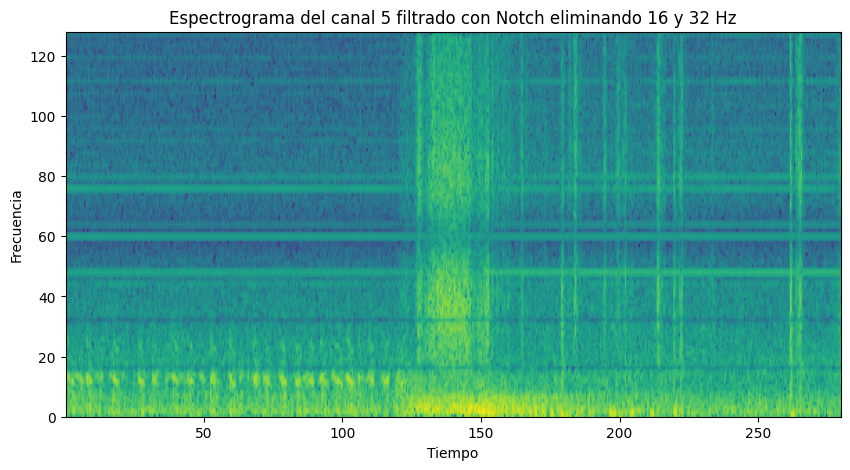

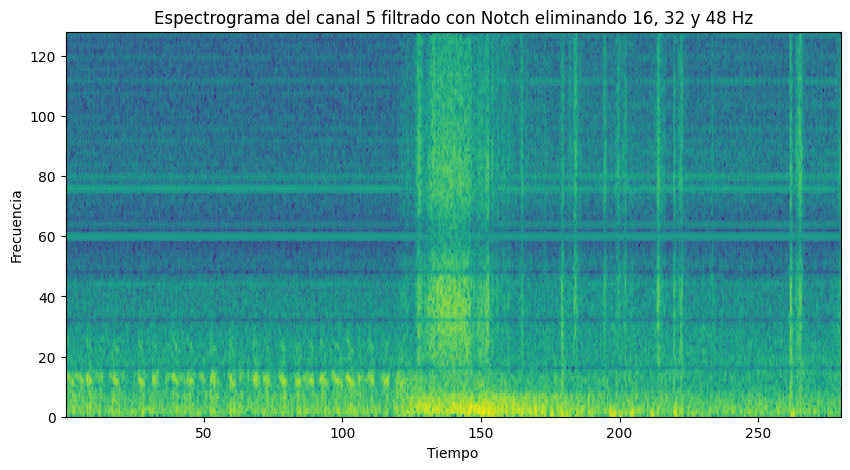

In [83]:
N = 5 #orden
wn = [31,33]

[b,a] = scipy.signal.butter(N, wn, btype = 'bandstop', output = 'ba', fs = fs)

filtrada = scipy.signal.filtfilt(b, a, filtrada)

plt.figure(figsize=(10,5))
plt.specgram(filtrada, Fs = fs)
plt.title('Espectrograma del canal 5 filtrado con Notch eliminando 16 y 32 Hz')
plt.xlabel('Tiempo')
plt.ylabel('Frecuencia')
plt.show()

N = 5 #orden
wn = [47,49]

[b,a] = scipy.signal.butter(N, wn, btype = 'bandstop', output = 'ba', fs = fs)

filtrada = scipy.signal.filtfilt(b, a, filtrada)

plt.figure(figsize=(10,5))
plt.specgram(filtrada, Fs = fs)
plt.title('Espectrograma del canal 5 filtrado con Notch eliminando 16, 32 y 48 Hz')
plt.xlabel('Tiempo')
plt.ylabel('Frecuencia')
plt.show()

<font color = "yellow">En vez de aplicar tantas veces un Notch, ¿qué filtro nos conviene usar para este tipo de ruido?</font>

[scipy.signal.iircomb()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.iircomb.html?highlight=comb#scipy.signal.iircomb)

In [84]:
from scipy.signal import iircomb

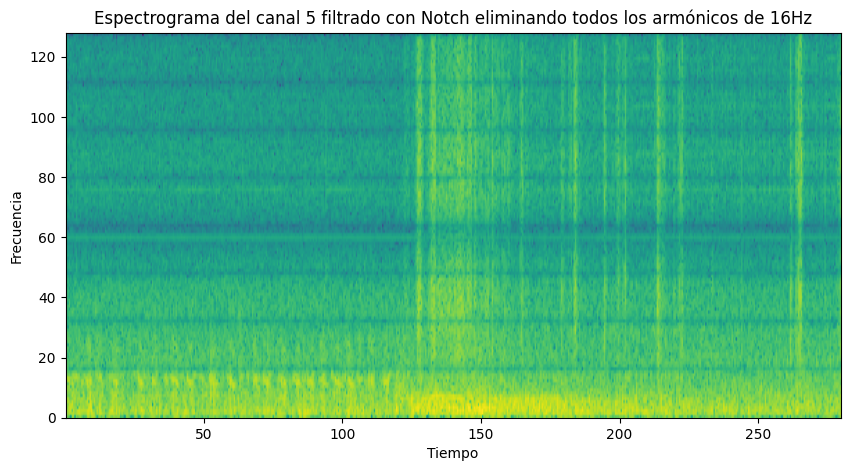

In [85]:
b,a = iircomb(w0=16,Q=16/2,ftype='notch',fs=fs )
filtrada = scipy.signal.filtfilt(b, a, x[5])

plt.figure(figsize=(10,5))
plt.specgram(filtrada, Fs = fs)
plt.title('Espectrograma del canal 5 filtrado con Notch eliminando todos los armónicos de 16Hz')
plt.xlabel('Tiempo')
plt.ylabel('Frecuencia')
plt.show()

## SEGMENTACIÓN DE EEG

### Supuestos y Restricciones

<font color = "yellow">¿Qué asumimos para el EEG para poder hacer la segmentación? ¿Qué ventajas tenemos por asumir esto? </font>

### Segmentación

<font color = "yellow">¿Por qué segmentar a una tira de EEG? ¿Hay algún límite? </font>

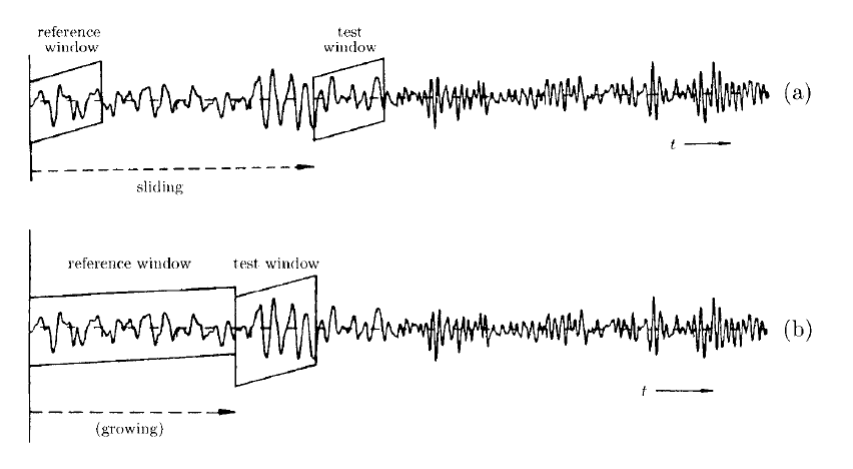

Asumimos que:

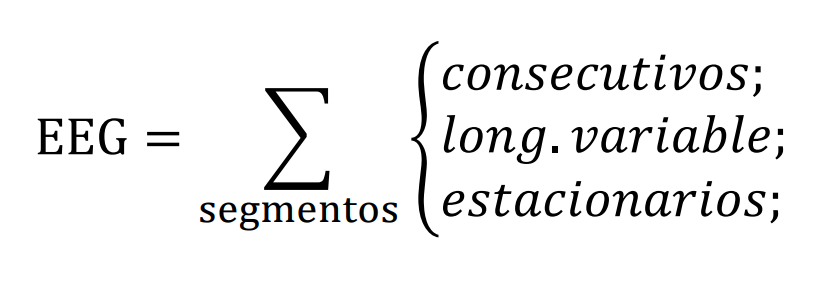

#### Periodograma

**PERIODOGRAMA MÓVIL**

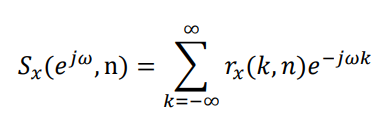

Voy a tener el periodograma desplazado ($r_x(k,n)$) y el de la ventana de referencia ($r_x(k,0)$)



> $n$: posicion variable de la ventana

> $k$: parámetro que indica el desplazamiento para calcular la correlación de la ventana en $n$

DISIMILITUD:

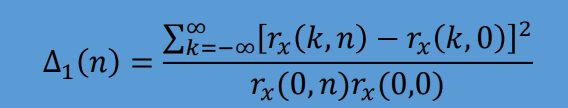

k : desplazamiento (interno)

n: tiempo donde calculo el coef. de disimilitud

##### CÓDIGO

Agarremos el canal 10

In [86]:
canal = 10
senal = x[canal]

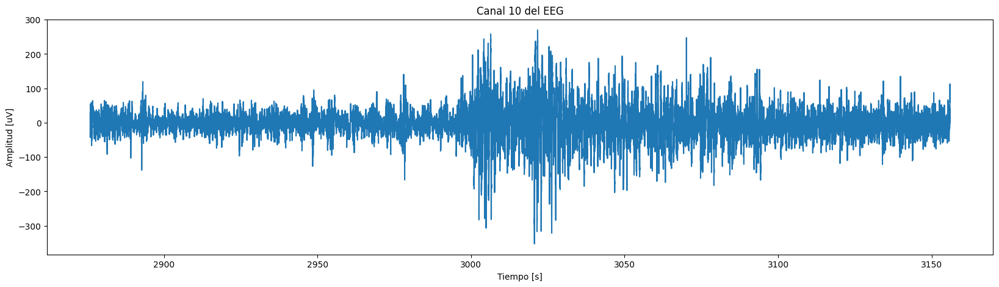

In [87]:
plt.figure(figsize=(20,5))
plt.plot(t,senal)
plt.title(f'Canal {canal} del EEG')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud [uV]')
plt.show()

[plt.acorr()](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.acorr.html)


> No cuenta con la opción de correlación sesgada --> no funciona para calcular el delta real de la ecuación (sesgado)

> Devuelve el gráfico de la autocorrelación de manera automática



[numpy.correlate()](https://numpy.org/doc/stable/reference/generated/numpy.correlate.html)

> Sí cuenta con la opción de correlación sesgada --> mode = 'full'

> No devuelve el gráfico de la autocorrelación de manera automática


Se requieren dos ventanas para el análisis
* Ventana de referencia ($R_W$)
* Ventana de testeo ($T_W$)

Recuerdo la ecuación del coeficiente de disimilud:

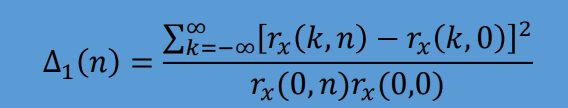

Vamos a tomar ventanas de largo `fs` (256 muestras = 1 segundo de señal), es decir, vamos a codear el Primer Abordaje.

In [88]:
senal.shape[0]

71681

In [89]:
N_win = fs
N_senal = senal.shape[0]

s_0 = senal[:N_win] # agarro la primer ventana --> ventana de referencia
r_0 = np.correlate(s_0,s_0,mode='full') # autocorrelación de la ventana de referencia

In [90]:
r_0.shape

(511,)

In [91]:
r_0

array([-5.82597975e+02, -1.21488757e+03, -1.94358348e+03, -2.36161136e+03,
       -2.43996535e+03, -2.69433912e+03, -2.99649622e+03, -3.24865638e+03,
       -3.58279626e+03, -3.76427371e+03, -3.58371223e+03, -3.23667238e+03,
       -2.47500138e+03, -1.30213414e+03,  2.96546758e+01,  1.28427264e+03,
        2.42149320e+03,  3.40902825e+03,  4.25298430e+03,  4.97977193e+03,
        5.24521372e+03,  4.86619109e+03,  4.06749945e+03,  2.93478243e+03,
        1.94717105e+03,  1.28389098e+03,  1.00486224e+03,  1.20526984e+03,
        1.93991958e+03,  3.18698076e+03,  4.91271496e+03,  6.99140469e+03,
        9.08612397e+03,  1.13972422e+04,  1.39611695e+04,  1.64262478e+04,
        1.86095113e+04,  1.98867996e+04,  2.01077403e+04,  1.92048566e+04,
        1.72546323e+04,  1.42967597e+04,  1.06617528e+04,  6.63150302e+03,
        2.84452078e+03, -1.35258907e+02, -2.06678206e+03, -2.80746197e+03,
       -2.31531648e+03, -5.99505338e+02,  2.54240184e+03,  7.12101509e+03,
        1.24364535e+04,  

In [92]:
r_0/r_0.shape[0] #normalizar

array([-1.14011345e+00, -2.37747078e+00, -3.80349018e+00, -4.62154866e+00,
       -4.77488327e+00, -5.27267929e+00, -5.86398477e+00, -6.35744888e+00,
       -7.01134297e+00, -7.36648476e+00, -7.01313548e+00, -6.33399682e+00,
       -4.84344693e+00, -2.54820772e+00,  5.80326337e-02,  2.51325370e+00,
        4.73873425e+00,  6.67128817e+00,  8.32286555e+00,  9.74515055e+00,
        1.02646061e+01,  9.52287884e+00,  7.95988151e+00,  5.74321416e+00,
        3.81051086e+00,  2.51250682e+00,  1.96646231e+00,  2.35864938e+00,
        3.79632013e+00,  6.23675295e+00,  9.61392360e+00,  1.36818096e+01,
        1.77810645e+01,  2.23038009e+01,  2.73212710e+01,  3.21452990e+01,
        3.64178303e+01,  3.89174161e+01,  3.93497853e+01,  3.75828896e+01,
        3.37664037e+01,  2.79780032e+01,  2.08644870e+01,  1.29775010e+01,
        5.56657686e+00, -2.64694535e-01, -4.04458328e+00, -5.49405474e+00,
       -4.53095202e+00, -1.17320027e+00,  4.97534606e+00,  1.39354503e+01,
        2.43374824e+01,  

In [93]:
r_0[len(r_0)//2] #potencia de la señal de referencia

np.float64(255266.5333852147)

In [94]:
len(r_0)

511

In [95]:
N_senal = senal.shape[0]
N_win = int(fs)

porcentaje = 0.75 # PORCENTAJE DE SOLAPAMIENTO

paso =  int((1-porcentaje)*N_win) # 75% de solapamiento  --> (N_win/4)

s_0 = senal[:N_win]
R_0 = np.correlate(s_0,s_0,mode='full')/s_0.shape[0]
R_00 = R_0[int(R_0.shape[0]/2)]

In [96]:
delta = []

for i in range(N_win, N_senal-N_win, paso):
  s_N = senal[i:i+N_win] #ventana de testeo (movil)
  R_N = np.correlate(s_N,s_N,mode='full')/s_N.shape[0] #autocorrelacion de ventana de testeo
  R_N0 = R_N[int(R_N.shape[0]/2)] #potencia de ventana de testeo
  d = np.sum((R_N-R_0)**2)/(R_N0*R_00)
  delta.append(d)

In [97]:
len(delta)

1113

In [98]:
senal.shape

(71681,)

In [99]:
delta = delta/max(delta)
senal = senal/max(senal)

In [100]:
delta_0 = scipy.signal.resample(delta, int(senal.shape[0]/fs)) # resampleo para poder graficar

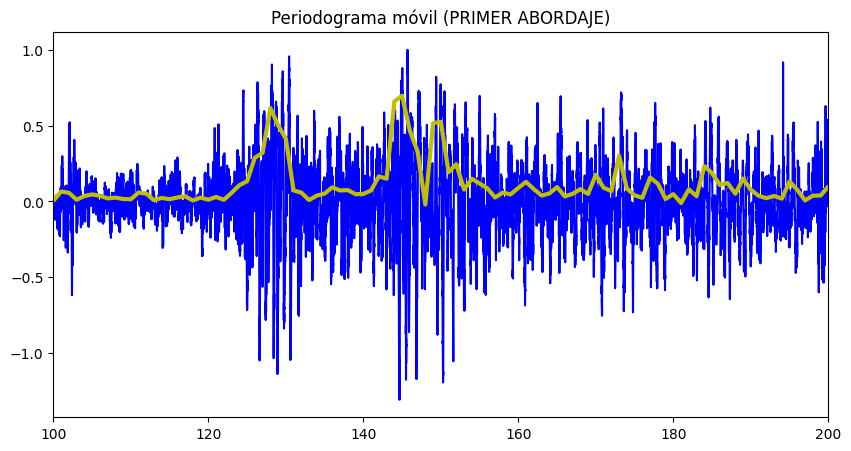

In [101]:
plt.figure(figsize=(10,5)) # Se pierden las escalas de amplitud del gráfico para mejorar la comparación
plt.title('Periodograma móvil (PRIMER ABORDAJE)')
plt.plot(t_reset,senal,'b')
plt.plot(delta_0,'y',linewidth=3)
plt.xlim([100,200])
plt.show()

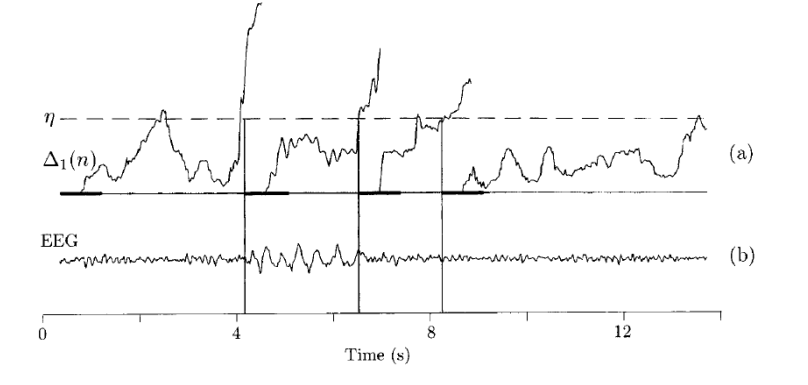

##### TAREA

Realizar el segundo abordaje

In [102]:
#umbral = 0.25*max(delta_0)

"""
def segmentacion(,,porcentaje_solapamiento,umbral):
  if delta[] > umbral =
    senal_segmentada.append(senal[])
  return senal_segmentada"""

'\ndef segmentacion(,,porcentaje_solapamiento,umbral):\n  if delta[] > umbral =\n    senal_segmentada.append(senal[])\n  return senal_segmentada'

#### Paramétrica (TAREA)

# EJERCITACIÓN

## EJERCICIO 1

**Sobre la señal eeg1.mat.**

a. ¿Cuántos canales hay en esta señal?

b. ¿Cuántos segundos de señal se registraron?

c. ¿Cuál es el ritmo dominante de esta señal?

d. Calcular la potencia absoluta y relativa de este ritmo dominante

## 2. EJERCICIO 2

**Extraer el canal "C3-P3" de la señal chb01_04.edf.**

a. ¿Hay ruido de deriva? Si es así, eliminarlo apropiadamente.

b. ¿Hay ruido de alta frecuencia? Si es así, eliminarlo apropiadamente.

c. ¿Qué otros ruidos/artefactos se observan presente en este canal? ¿Cómo se podrían eliminar? ¿Falta información para poder eliminarlos?

## 3. EJERCICIO 3

**Sobre la señal eeg2.mat.**

a. Aplicar la segmentación por periodograma en cada canal optimizando los parámetros. ¿Cuántos segmentos se pudieron encontrar en cada canal?

b. Aplicar la segmentación paramétrica en cada canal optimizando los parámetros. ¿Cuántos segmentos se pudieron encontrar en cada canal?

c. Aplicar un espectrograma adecuado a cada canal. ¿Se corresponden los resultados con los segmentos encontrados? ¿A cuál se "corresponde más"?

d. Detectar la potencia absoluta de cada ritmo en cada segmento detectado según el método que crea que se obtuvo los mejores resultados. ¿Qué ritmo predomina en cada segmento?